# Sequential SAR Change Detection

In [ ]:
import ee
ee.Authenticate()

In [1]:
from auxil.eeSar_seq import run
run()

Map(center=[50.911335812533714, 6.359964580088042], controls=(MeasureControl(options=['active_color', 'capture…

## Hambach

In [2]:
%matplotlib inline
!ls imagery/hambach

T20101011_Spk_RL.dim	      T20180927_3_Spk_FR.tif
T20180927_15_rl.tif	      T20180927_3_Spk_GM.tif
T20180927_28_atsf_hybrid.tif  T20180927_3_Spk_ID.tif
T20180927_28_atsf_log.tif     T20180927_3_Spk_RL.tif
T20180927_28_atsf_thresh.tif  T20180927_3.tif
T20180927_28_atsf.tif	      T20180930_s2.tif
T20180927_28_meanfilter.tif   users-mortcanty-hambach.csv
T20180927_3_enl.tif


In [1]:
# //Extended Directional Smoothing
def eds(image):
    image = ee.Image(image).log()
#  Create a list of weights for a 3x3 kernel.
    dir1 = ee.List([[0, 0, 0], [1, 0, 1], [0, 0, 0]])
    dir2 = ee.List([[0, 1, 0], [0, 0, 0], [0, 1, 0]])
    dir3 = ee.List([[0, 0, 1], [0, 0, 0], [1, 0, 0]])
    dir4 = ee.List([[1, 0, 0], [0, 0, 0], [0, 0, 1]])
#  Convolve directional kernels with the image
    d1 = image.convolve(ee.Kernel.fixed(3, 3, dir1, -1, -1, True))
    d2 = image.convolve(ee.Kernel.fixed(3, 3, dir2, -1, -1, True))
    d3 = image.convolve(ee.Kernel.fixed(3, 3, dir3, -1, -1, True))
    d4 = image.convolve(ee.Kernel.fixed(3, 3, dir4, -1, -1, True))
#  Absolute value of the difference from convolved image with original values
    D1=(d1.subtract(image)).abs()
    D2=(d2.subtract(image)).abs()
    D3=(d3.subtract(image)).abs()
    D4=(d4.subtract(image)).abs()
#  Pick min pixel value based on abs difference using reducers (minimizes on first input = VV only) 
    Dd=ee.ImageCollection([[D1,d1],[D2,d2],[D3,d3],[D4,d4]])
    reducer = ee.Reducer.min(4)
#  Select and return the third and fourth inputs to the reducer
    return Dd.reduce(reducer).select('min2','min3').exp()

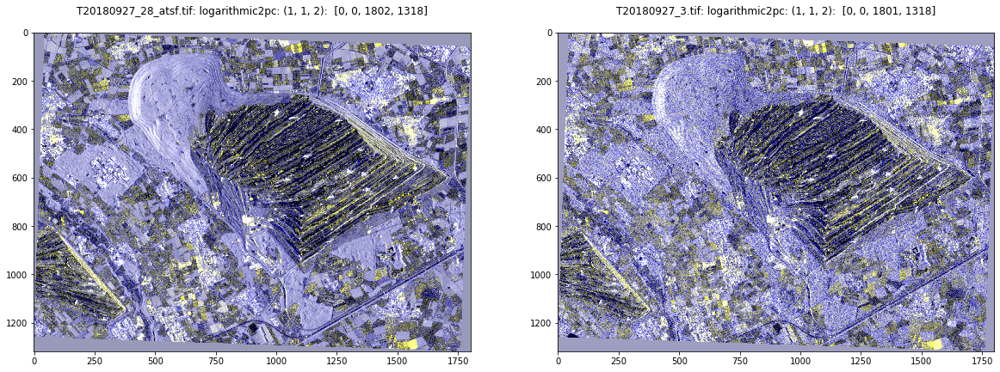

In [13]:
%run scripts/dispms -f imagery/hambach/T20180927_28_atsf.tif -p [1,1,2] -F imagery/hambach/T20180927_3.tif -P [1,1,2]

In [18]:
%run scripts/gamma_filter imagery/hambach/T20180927_3.tif 4.4

    GAMMA MAP FILTER
Sun Feb 23 13:02:00 2020
infile:  imagery/hambach/T20180927_3.tif
equivalent number of looks: 4.400000
Attempting parallel computation ...
available engines: [0, 1]
filtering 2 diagonal matrix element bands ...
result written to: imagery/hambach/T20180927_3_gamma.tif
elapsed time: 382.06240344047546


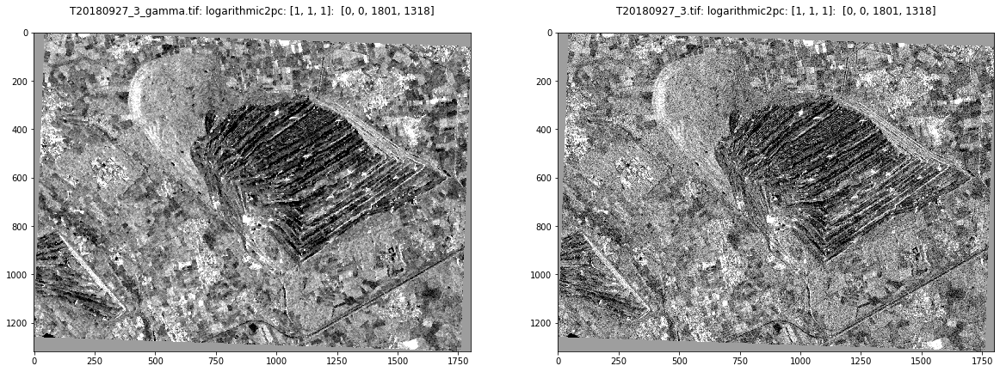

In [19]:
%run scripts/dispms -f imagery/hambach/T20180927_3_gamma.tif -F imagery/hambach/T20180927_3.tif

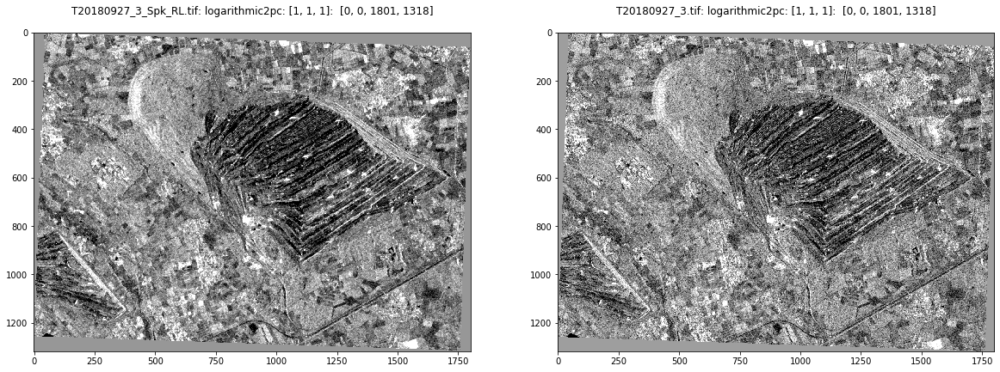

In [3]:
%run scripts/dispms -f imagery/hambach/T20180927_3_Spk_RL.tif -F imagery/hambach/T20180927_3.tif

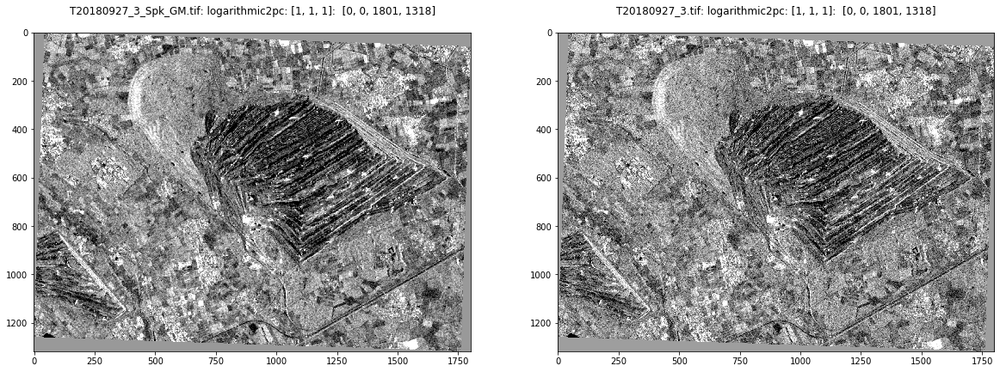

In [4]:
%run scripts/dispms -f imagery/hambach/T20180927_3_Spk_GM.tif -F imagery/hambach/T20180927_3.tif

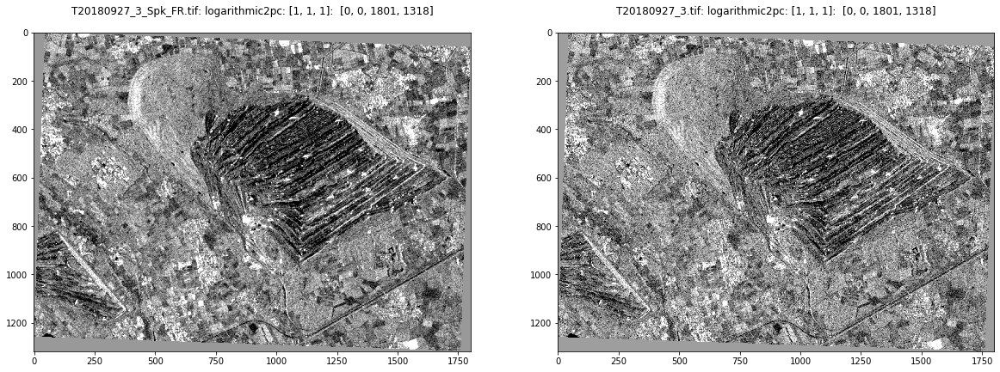

In [5]:
%run scripts/dispms -f imagery/hambach/T20180927_3_Spk_FR.tif -F imagery/hambach/T20180927_3.tif

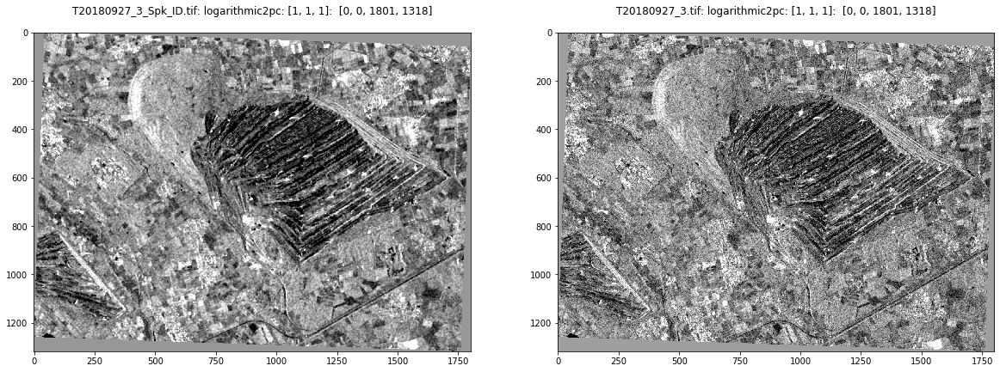

In [6]:
%run scripts/dispms -f imagery/hambach/T20180927_3_Spk_ID.tif -F imagery/hambach/T20180927_3.tif

In [7]:
%run scripts/fidelity -d [500,100,800,800] imagery/hambach/T20180927_28_atsf.tif imagery/hambach/T20180927_3.tif

Comparing imagery/hambach/T20180927_28_atsf.tif with imagery/hambach/T20180927_3.tif
minus log mean bias: 3.291338


In [8]:
%run scripts/fidelity -d [500,100,800,800] imagery/hambach/T20180927_3_Spk_RL.tif imagery/hambach/T20180927_3.tif

Comparing imagery/hambach/T20180927_3_Spk_RL.tif with imagery/hambach/T20180927_3.tif
minus log mean bias: 2.549675


In [9]:
%run scripts/fidelity -d [500,100,800,800] imagery/hambach/T20180927_3_Spk_GM.tif imagery/hambach/T20180927_3.tif

Comparing imagery/hambach/T20180927_3_Spk_GM.tif with imagery/hambach/T20180927_3.tif
minus log mean bias: 3.460479


In [10]:
%run scripts/fidelity -d [500,100,800,800] imagery/hambach/T20180927_3_Spk_FR.tif imagery/hambach/T20180927_3.tif

Comparing imagery/hambach/T20180927_3_Spk_FR.tif with imagery/hambach/T20180927_3.tif
minus log mean bias: 4.526053


In [3]:
%run scripts/fidelity -d [500,100,800,800] imagery/hambach/T20180927_3_Spk_ID.tif imagery/hambach/T20180927_3.tif

Comparing imagery/hambach/T20180927_3_Spk_ID.tif with imagery/hambach/T20180927_3.tif
minus log mean bias: 2.136733


In [2]:
%run scripts/fidelity -d [500,100,800,800] imagery/hambach/T20180927_28_meanfilter.tif imagery/hambach/T20180927_3.tif

Comparing imagery/hambach/T20180927_28_meanfilter.tif with imagery/hambach/T20180927_3.tif
minus log mean bias: -0.017659


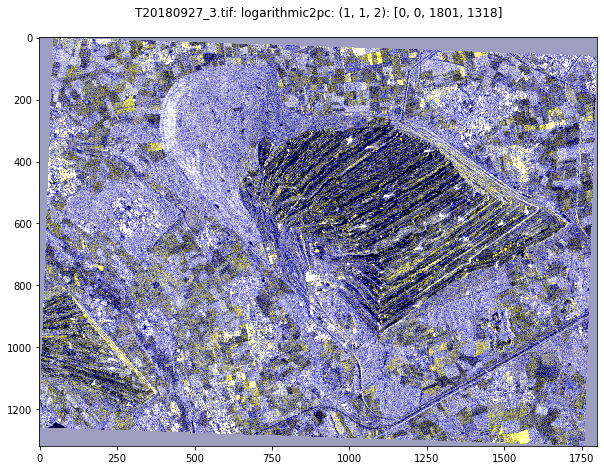

In [2]:
%run scripts/dispms -f  imagery/hambach/T20180927_3.tif -p [1,1,2] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig1a.png"

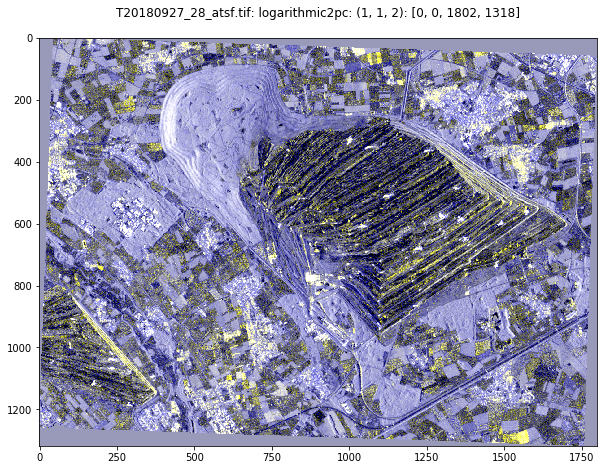

In [3]:
%run scripts/dispms -f  imagery/hambach/T20180927_28_atsf.tif -p [1,1,2] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig1b.png"

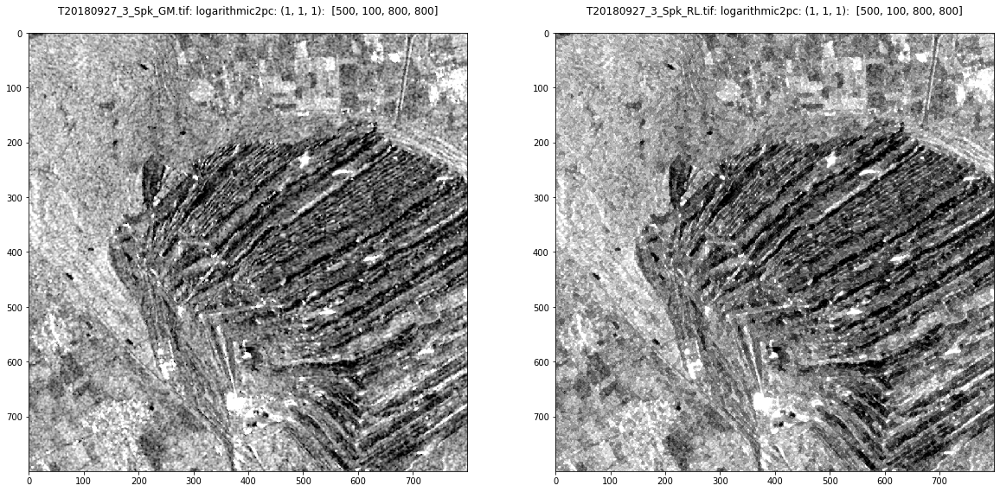

In [13]:
%run scripts/dispms -f imagery/hambach/T20180927_3_Spk_GM.tif -d [500,100,800,800] -p [1,1,1] \
-F imagery/hambach/T20180927_3_Spk_RL.tif -D [500,100,800,800] -P [1,1,1]   \
-s "/home/mort/LaTeX/new projects/atsf2020/fig2a.png"

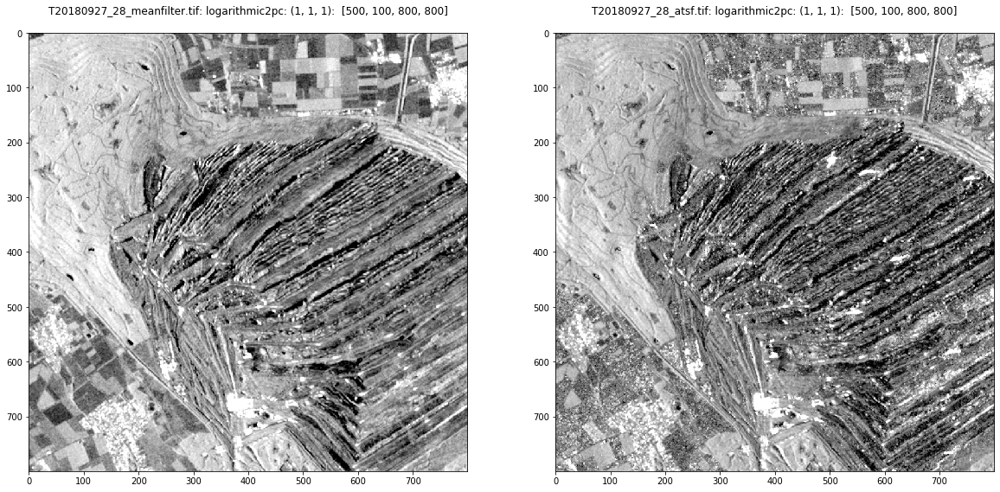

In [9]:
%run scripts/dispms -f imagery/hambach/T20180927_28_meanfilter.tif -d [500,100,800,800] -p [1,1,1]\
-F imagery/hambach/T20180927_28_atsf.tif -D [500,100,800,800] -P [1,1,1] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig2b.png"

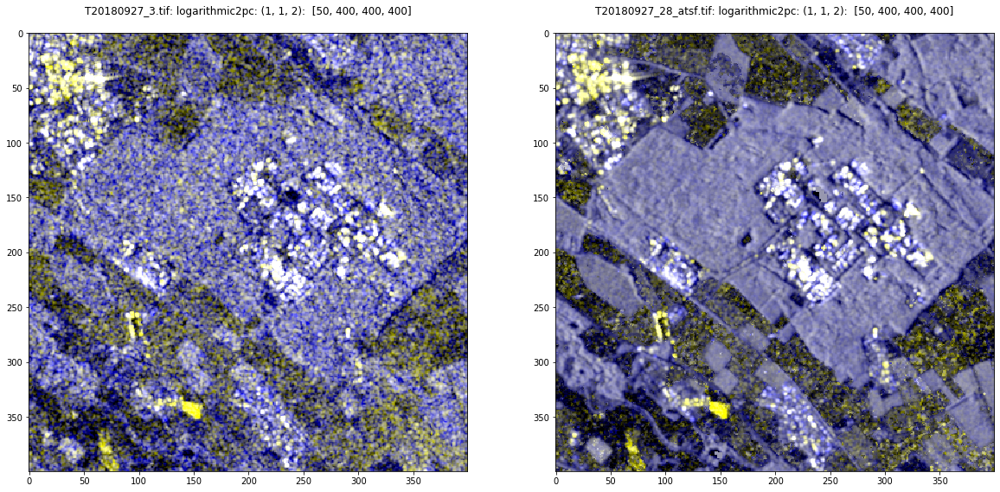

In [16]:
%run scripts/dispms -f imagery/hambach/T20180927_3.tif -d [50,400,400,400] -e 5 -p [1,1,2] \
-F imagery/hambach/T20180927_28_atsf.tif -D [50,400,400,400]  -E 5 -P [1,1,2] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig3a.png"

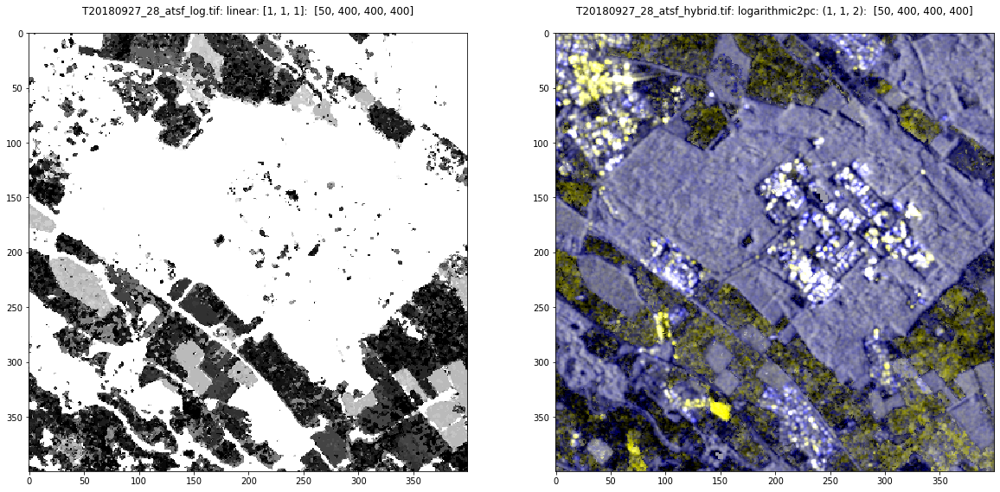

In [3]:
%run scripts/dispms -f imagery/hambach/T20180927_28_atsf_log.tif -e 2 -d [50,400,400,400] \
-F imagery/hambach/T20180927_28_atsf_hybrid.tif -D [50,400,400,400]  -E 5 -P [1,1,2] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig3b.png"

In [14]:
%run scripts/atsfthreshold imagery/hambach/T20180927_28_atsf.tif \
imagery/hambach/T20180927_3_Spk_RL.tif \
imagery/hambach/T20180927_28_atsf_log.tif

Replacing imagery/hambach/T20180927_28_atsf.tif with imagery/hambach/T20180927_3_Spk_RL.tif under threshold
result written to: imagery/hambach/T20180927_28_atsf_thresh.tif


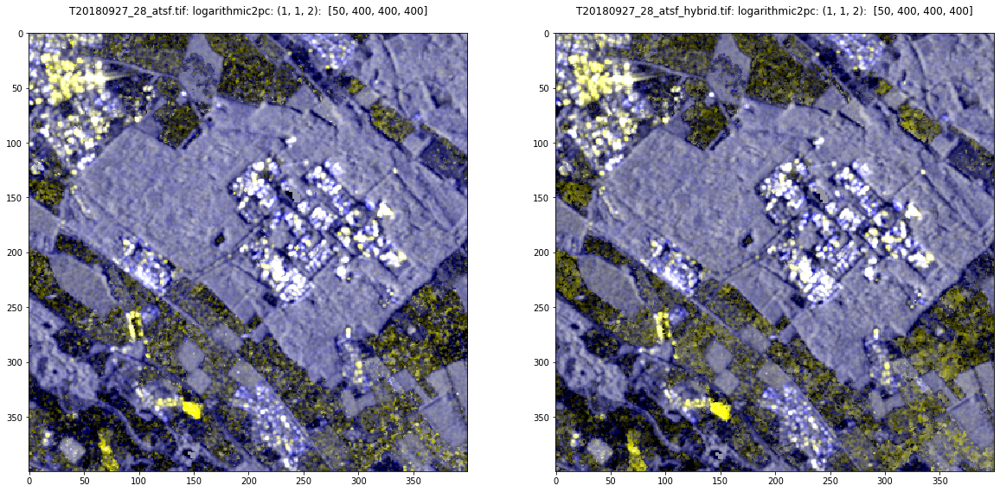

In [16]:
%run scripts/dispms -f imagery/hambach/T20180927_28_atsf.tif -d [50,400,400,400]  -p [1,1,2] \
-F imagery/hambach/T20180927_28_atsf_hybrid.tif -D [50,400,400,400]  -P [1,1,2]

## Bonn

In [6]:
%matplotlib inline
ls imagery/radarsat2bonn

dualpol_bmap.tif  T12_atsf.tif        T20090805.tif  T20100707.tif
dualpol_cmap.tif  T12_meanfilter.tif  T20090829.tif  T20100731.tif
dualpol_fmap.tif  T20090525.tif       T20091016.tif  T20100824.tif
dualpol_smap.tif  T20090618.tif       T20100426.tif  T20101011.tif
T12_atsf_log.tif  T20090712.tif       T20100520.tif


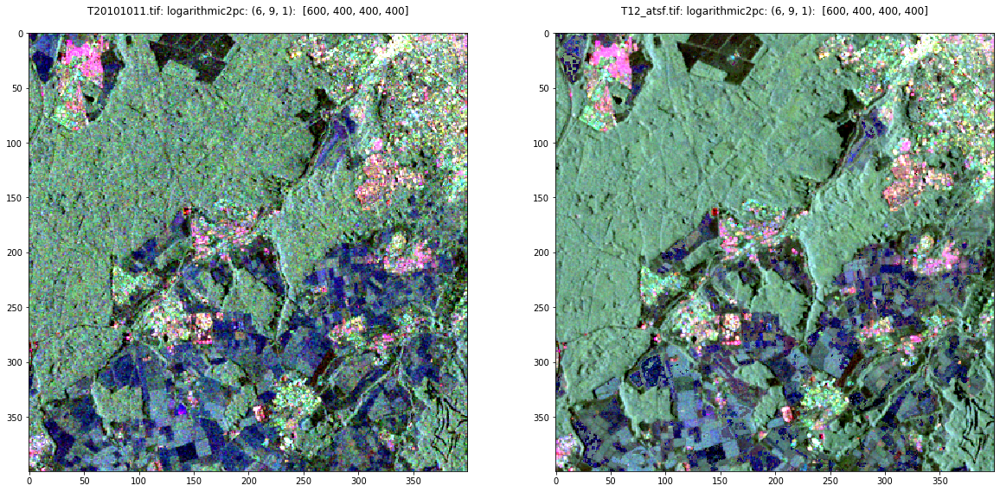

In [2]:
%run scripts/dispms -f imagery/radarsat2bonn/T20101011.tif -p [6,9,1] -d [600,400,400,400]  \
-F imagery/radarsat2bonn/T12_atsf.tif -P [6,9,1] -D [600,400,400,400] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig4.png"

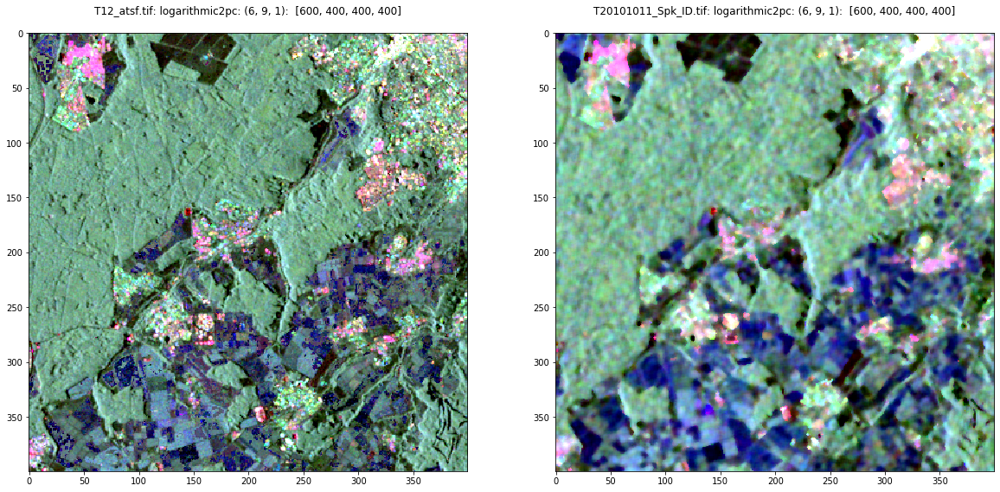

In [7]:
%run scripts/dispms -f imagery/radarsat2bonn/T12_atsf.tif -p [6,9,1] -d [600,400,400,400]  \
-F imagery/radarsat2bonn/T20101011_Spk_ID.tif -P [6,9,1] -D [600,400,400,400] 

In [6]:
%run scripts/fidelity -d [600,400,400,400] -p [1,6,9] imagery/radarsat2bonn/T12_atsf.tif imagery/radarsat2bonn/T20101011.tif

Comparing imagery/radarsat2bonn/T12_atsf.tif with imagery/radarsat2bonn/T20101011.tif
minus log mean bias: 2.607630


In [29]:
%run scripts/fidelity -d [600,400,400,400] -p [1,6,9] imagery/radarsat2bonn/T20101011_Spk_RL.tif imagery/radarsat2bonn/T20101011.tif

Comparing imagery/radarsat2bonn/T20101011_Spk_RL.tif with imagery/radarsat2bonn/T20101011.tif
minus log mean bias: 2.799567


In [30]:
%run scripts/fidelity -d [600,400,400,400] -p [1,6,9] imagery/radarsat2bonn/T20101011_Spk_GM.tif imagery/radarsat2bonn/T20101011.tif

Comparing imagery/radarsat2bonn/T20101011_Spk_GM.tif with imagery/radarsat2bonn/T20101011.tif
minus log mean bias: 4.462218


In [31]:
%run scripts/fidelity -d [600,400,400,400] -p [1,6,9] imagery/radarsat2bonn/T20101011_Spk_FR.tif imagery/radarsat2bonn/T20101011.tif

Comparing imagery/radarsat2bonn/T20101011_Spk_FR.tif with imagery/radarsat2bonn/T20101011.tif
minus log mean bias: 4.107441


In [8]:
%run scripts/fidelity -d [600,400,400,400] -p [1,6,9] imagery/radarsat2bonn/T20101011_Spk_ID.tif imagery/radarsat2bonn/T20101011.tif

Comparing imagery/radarsat2bonn/T20101011_Spk_ID.tif with imagery/radarsat2bonn/T20101011.tif
minus log mean bias: 1.640879


In [3]:
%run scripts/fidelity -d [600,400,400,400] -p [1,6,9] imagery/radarsat2bonn/T12_mean.tif imagery/radarsat2bonn/T20101011.tif

Comparing imagery/radarsat2bonn/T12_mean.tif with imagery/radarsat2bonn/T20101011.tif
minus log mean bias: 2.532353


## Frankfurt

In [9]:
ls imagery/ffa

canny_edges.tif               T20181027_33_atsf.tif    T20181027_33_Spk_RL.tif
T20180505_s2.tif              T20181027_33_Spk_FR.tif  T20181027_33.tif
T20181027_33_atsf_hybrid.tif  T20181027_33_Spk_GM.tif  users-mortcanty-ffa.csv
T20181027_33_atsf_log.tif     T20181027_33_Spk_ID.tif


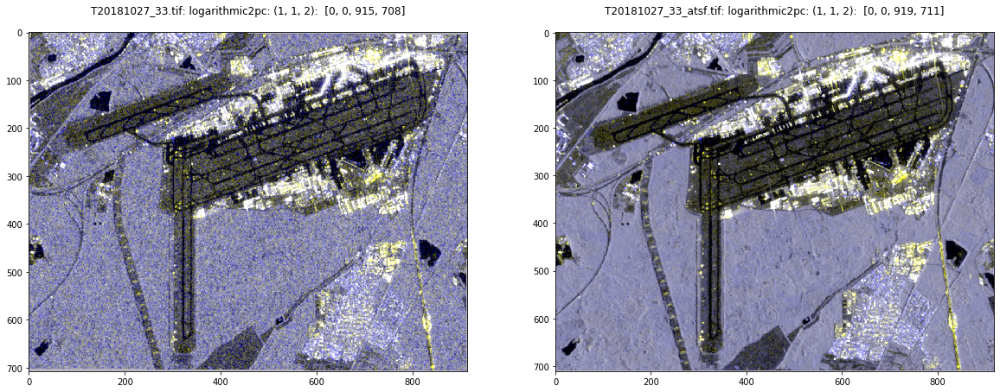

In [81]:
%run scripts/dispms -f imagery/ffa/T20181027_33.tif -p [1,1,2] -F imagery/ffa/T20181027_33_atsf.tif -P [1,1,2] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig5.png"

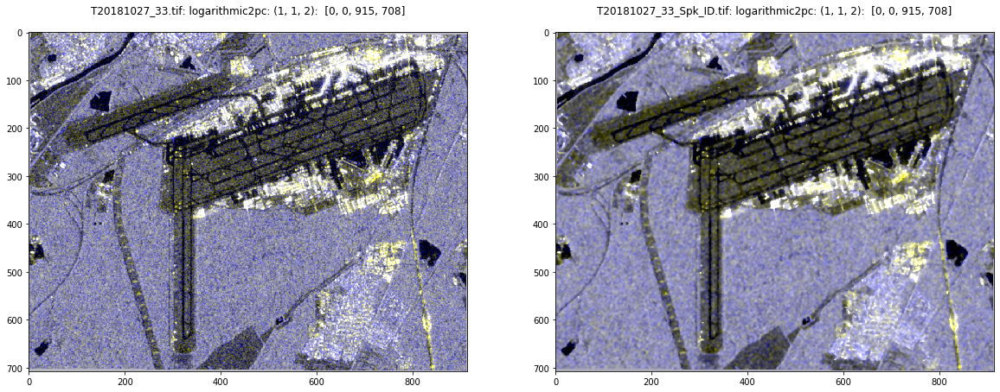

In [13]:
%run scripts/dispms -f imagery/ffa/T20181027_33.tif -p [1,1,2] -F imagery/ffa/T20181027_33_Spk_ID.tif -P [1,1,2]

In [3]:
ls imagery/ffa

canny_edges.tif               T20181027_33_atsf.tif    T20181027_33_Spk_ID.tif
T20180505_s2.tif              T20181027_33_mean.tif    T20181027_33_Spk_RL.tif
T20181027_33_atsf_hybrid.tif  T20181027_33_Spk_FR.tif  T20181027_33.tif
T20181027_33_atsf_log.tif     T20181027_33_Spk_GM.tif  users-mortcanty-ffa.csv


In [20]:
%run scripts/fidelity -d [0,0,700,700] -p [1,2] imagery/ffa/T20181027_33_atsf.tif imagery/ffa/T20181027_33.tif

Comparing imagery/ffa/T20181027_33_atsf.tif with imagery/ffa/T20181027_33.tif
minus log mean bias: 2.514518


In [21]:
%run scripts/fidelity -d [0,0,700,700] -p [1,2] imagery/ffa/T20181027_33_Spk_RL.tif imagery/ffa/T20181027_33.tif

Comparing imagery/ffa/T20181027_33_Spk_RL.tif with imagery/ffa/T20181027_33.tif
minus log mean bias: 1.477458


In [22]:
%run scripts/fidelity -d [0,0,700,700] -p [1,2] imagery/ffa/T20181027_33_Spk_GM.tif imagery/ffa/T20181027_33.tif

Comparing imagery/ffa/T20181027_33_Spk_GM.tif with imagery/ffa/T20181027_33.tif
minus log mean bias: 2.736430


In [23]:
%run scripts/fidelity -d [0,0,700,700] -p [1,2] imagery/ffa/T20181027_33_Spk_FR.tif imagery/ffa/T20181027_33.tif

Comparing imagery/ffa/T20181027_33_Spk_FR.tif with imagery/ffa/T20181027_33.tif
minus log mean bias: 3.062356


In [24]:
%run scripts/fidelity -d [0,0,700,700] -p [1,2] imagery/ffa/T20181027_33_Spk_ID.tif imagery/ffa/T20181027_33.tif

Comparing imagery/ffa/T20181027_33_Spk_ID.tif with imagery/ffa/T20181027_33.tif
minus log mean bias: 0.972011


In [5]:
%run scripts/fidelity -d [0,0,700,700] -p [1,2] imagery/ffa/T20181027_33_mean.tif imagery/ffa/T20181027_33.tif

Comparing imagery/ffa/T20181027_33_mean.tif with imagery/ffa/T20181027_33.tif
minus log mean bias: -0.034534


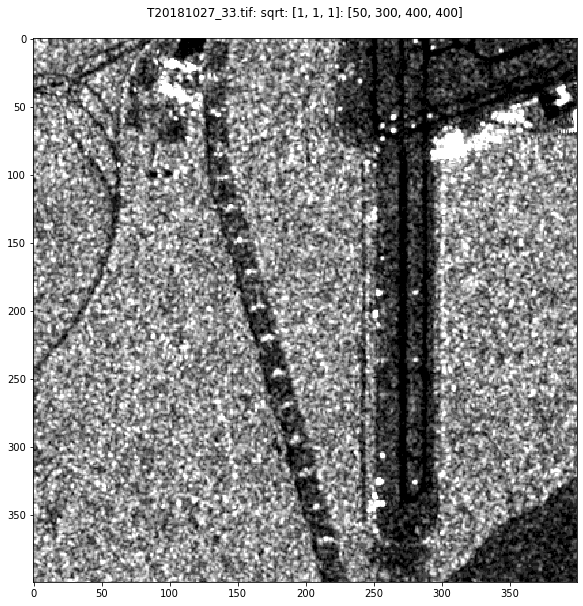

In [2]:
%run scripts/dispms -f imagery/ffa/T20181027_33.tif -d [50,300,400,400] -e 7 \
-s "/home/mort/LaTeX/new projects/atsf2020/fig6a.png"

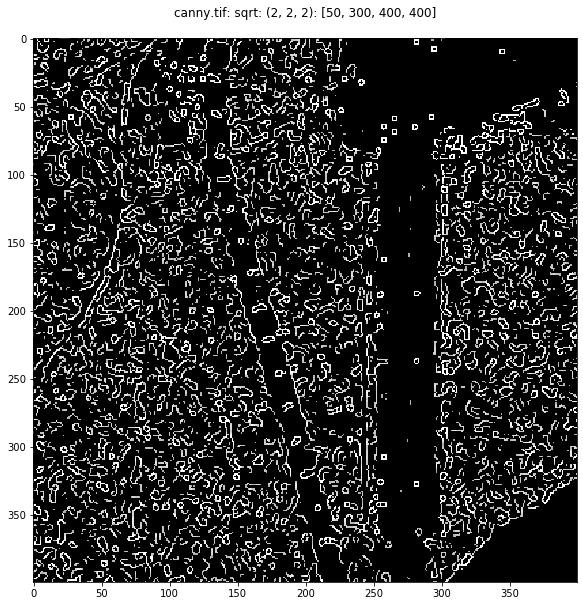

In [55]:
%run scripts/dispms -f imagery/ffa/canny.tif -e 7 -p [2,2,2] -d [50,300,400,400] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig6b.png"

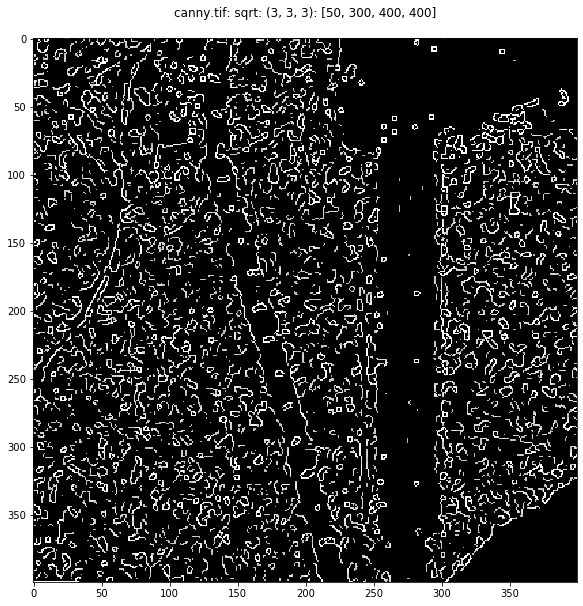

In [56]:
%run scripts/dispms -f imagery/ffa/canny.tif -e 7 -p [3,3,3] -d [50,300,400,400] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig6c.png"

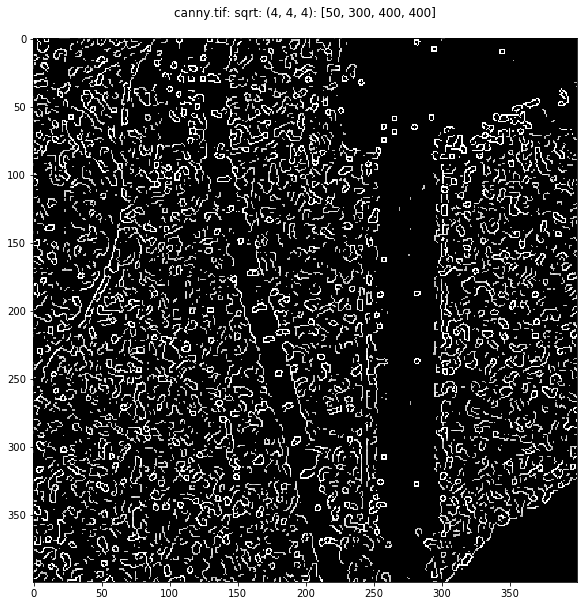

In [57]:
%run scripts/dispms -f imagery/ffa/canny.tif -e 7 -p [4,4,4] -d [50,300,400,400] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig6d.png"

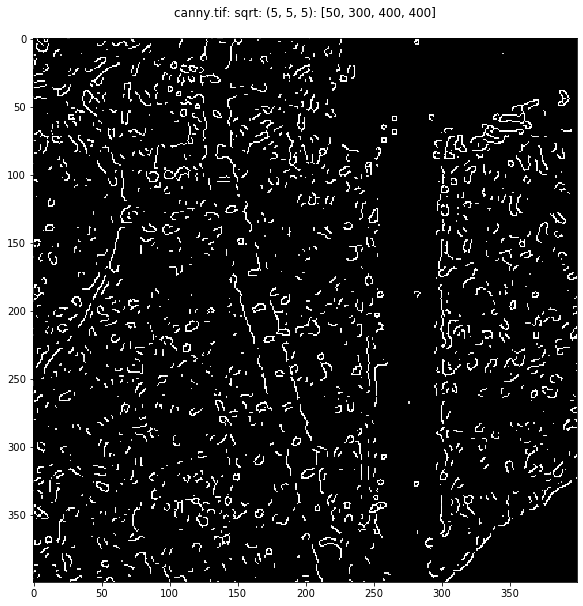

In [58]:
%run scripts/dispms -f imagery/ffa/canny.tif -e 7 -p [5,5,5] -d [50,300,400,400] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig6e.png"

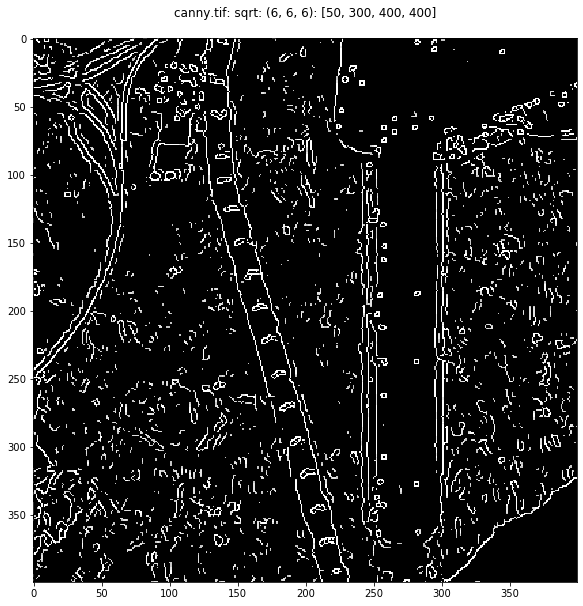

In [59]:
%run scripts/dispms -f imagery/ffa/canny.tif -e 7 -p [6,6,6] -d [50,300,400,400] \
-s "/home/mort/LaTeX/new projects/atsf2020/fig6f.png"

In [18]:
ls imagery/euskirchen


T20180926_29_atsf_hybrid.tif  T20180926_29_Spk_GM.tif
T20180926_29_atsf_log.tif     T20180926_29.tif
T20180926_29_atsf.tif         users-mortcanty-atsf-euskirchen.csv
T20180926_29_mean.tif


In [29]:
%run scripts/dispms -f imagery/euskirchen/T20180926_.tif -p [1,1,2] -d [100,100,800,800] \
-F imagery/euskirchen/T20180926_29_atsf_thresh.tif -P [1,1,2] -D [100,100,800,800]

Error in dispms: 'NoneType' object has no attribute 'RasterXSize'  --could not read image file


In [27]:
%run scripts/atsfthreshold -t 15 imagery/euskirchen/T20180926_29_atsf.tif imagery/euskirchen/T20180926_29_Spk_GM.tif imagery/euskirchen/T20180926_29_atsf_log.tif

Replacing imagery/euskirchen/T20180926_29_atsf.tif with imagery/euskirchen/T20180926_29_Spk_GM.tif under threshold
result written to: imagery/euskirchen/T20180926_29_atsf_thresh.tif
